In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mfekadu/darpa-timit-acousticphonetic-continuous-speech")

print("Path to dataset files:", path)

100%|██████████| 829M/829M [00:14<00:00, 60.0MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mfekadu/darpa-timit-acousticphonetic-continuous-speech/versions/6


In [ ]:
import numpy as np
import pandas as pd
import librosa
import librosa.display
import os
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, LSTM
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

In [ ]:
DATASET_PATH = "/root/.cache/kagglehub/datasets/mfekadu/darpa-timit-acousticphonetic-continuous-speech/versions/6/data/TRAIN"
folders = os.listdir(DATASET_PATH)
print(folders)

['DR4', 'DR8', 'DR6', 'DR2', 'DR7', 'DR1', 'DR5', 'DR3']


In [ ]:
def extract_features(file_path, max_pad_length=100):
    y, sr = librosa.load(file_path, sr=16000)  # Load with 16kHz sample rate
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

    # Padding or truncating
    pad_width = max_pad_length - mfcc.shape[1]
    if pad_width > 0:
        mfcc = np.pad(mfcc, pad_width=((0, 0), (0, pad_width)), mode='constant')
    else:
        mfcc = mfcc[:, :max_pad_length]

    return mfcc


In [ ]:
X, y = [], []

for dialect in os.listdir(DATASET_PATH):
    dialect_path = os.path.join(DATASET_PATH, dialect)
    for speaker in os.listdir(dialect_path):
        speaker_path = os.path.join(dialect_path, speaker)

        label = 0 if speaker[0] == 'M' else 1  # 'M' for Male, 'F' for Female

        for file in os.listdir(speaker_path):
            if file.endswith(".WAV"):
                file_path = os.path.join(speaker_path, file)
                features = extract_features(file_path)
                X.append(features)
                y.append(label)

X = np.array(X)
y = np.array(y)


In [ ]:
X = X.reshape(X.shape[0], X.shape[1], X.shape[2], 1)  # Add channel dimension

In [ ]:
y = to_categorical(y, num_classes=2)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42, stratify=y)

<ipython-input-9-ae66671118db>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['Male', 'Female'], y=gender_counts, palette=['blue', 'red'])


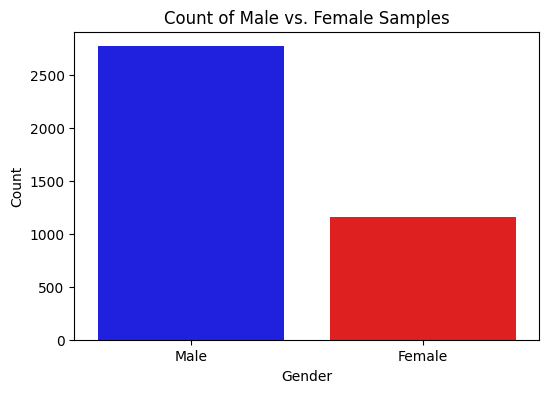

In [ ]:
# Convert one-hot encoded labels to class labels
y_train_labels = np.argmax(y_train, axis=1)

# Count occurrences of each gender
gender_counts = np.bincount(y_train_labels)

# Create bar plot
plt.figure(figsize=(6, 4))
sns.barplot(x=['Male', 'Female'], y=gender_counts, palette=['blue', 'red'])
plt.xlabel("Gender")
plt.ylabel("Count")
plt.title("Count of Male vs. Female Samples")
plt.show()

In [ ]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train.reshape(X_train.shape[0], -1), y_train.argmax(axis=1))

# Reshape back
X_train_resampled = X_train_resampled.reshape(-1, 13, 100, 1)
y_train_resampled = to_categorical(y_train_resampled, num_classes=2)

In [ ]:
model = Sequential([
    Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=(13, 100, 1)),
    MaxPooling2D(pool_size=(2,2)),
    Dropout(0.2),

    Conv2D(64, kernel_size=(3,3), activation='relu'),
    MaxPooling2D(pool_size=(2,2)),
    Dropout(0.2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.3),

    Dense(2, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 11, 98, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 5, 49, 32)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 5, 49, 32)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 3, 47, 64)           │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 1, 23, 64)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1, 23, 64)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1472)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         188,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 207,618 (811.01 KB)

 Trainable params: 207,618 (811.01 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train_resampled, y_train_resampled, epochs=30, batch_size=32,
                    validation_data=(X_test, y_test))
# Extract accuracy and loss values
epochs = range(1, len(history.history['accuracy']) + 1)
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']
# Plot accuracy
axes[0].plot(epochs, train_acc, 'b-', label="Training Accuracy")
axes[0].plot(epochs, val_acc, 'r-', label="Validation Accuracy")
axes[0].set_title("Model Accuracy per Epoch")
axes[0].set_xlabel("Epochs")
axes[0].set_ylabel("Accuracy")
axes[0].legend()

# Plot loss
axes[1].plot(epochs, train_loss, 'b-', label="Training Loss")
axes[1].plot(epochs, val_loss, 'r-', label="Validation Loss")
axes[1].set_title("Model Loss per Epoch")
axes[1].set_xlabel("Epochs")
axes[1].set_ylabel("Loss")
axes[1].legend()

# Show the figure
plt.show()

Epoch 1/30
174/174 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9932 - loss: 0.0185 - val_accuracy: 0.9856 - val_loss: 0.0370
Epoch 2/30
174/174 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - accuracy: 0.9932 - loss: 0.0179 - val_accuracy: 0.9582 - val_loss: 0.1996
Epoch 3/30
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - accuracy: 0.9856 - loss: 0.0649 - val_accuracy: 0.9928 - val_loss: 0.0257
Epoch 4/30
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - accuracy: 0.9940 - loss: 0.0225 - val_accuracy: 0.9899 - val_loss: 0.0376
Epoch 5/30
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - accuracy: 0.9955 - loss: 0.0120 - val_accuracy: 0.9870 - val_loss: 0.0541
Epoch 6/30
174/174 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - accuracy: 0.9945 - loss: 0.0164 - val_accuracy: 0.9798 - val_loss: 0.0537
Epoch 7/30
174/174 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - accuracy: 0.9946 - loss: 0.0147 - val_accuracy: 0.9827 - val_loss: 0.0539
Epoch 8/30
174/174 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - accuracy: 0.9885 - loss: 0.0341 - val

AttributeError: 'numpy.ndarray' object has no attribute 'plot'

In [ ]:


# Convert history to DataFrame
history_df = pd.DataFrame(history.history)
history_df.index += 1  # Start index from 1 for readability

# Display table
print(history_df)


    accuracy      loss  val_accuracy  val_loss
1   0.992782  0.021014      0.985570  0.037033
2   0.990437  0.025512      0.958153  0.199649
3   0.992422  0.028681      0.992785  0.025655
4   0.993685  0.024657      0.989899  0.037576
5   0.994406  0.015820      0.987013  0.054087
6   0.992963  0.019958      0.979798  0.053659
7   0.995128  0.014993      0.982684  0.053882
8   0.992602  0.021295      0.981241  0.066800
9   0.993324  0.019651      0.982684  0.050699
10  0.994587  0.019439      0.976912  0.059736
11  0.993143  0.018341      0.984127  0.034037
12  0.996391  0.010629      0.976912  0.082745
13  0.991519  0.025666      0.985570  0.042780
14  0.997113  0.009067      0.976912  0.060172
15  0.993865  0.017645      0.985570  0.039947
16  0.993685  0.020991      0.981241  0.050066
17  0.988452  0.032615      0.987013  0.039611
18  0.996030  0.015381      0.984127  0.038715
19  0.997835  0.006672      0.975469  0.076951
20  0.995669  0.010606      0.984127  0.056423
21  0.993504 

In [ ]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_acc:.4f}, Test Loss: {test_loss:.4f}")

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.9938 - loss: 0.0298
Test Accuracy: 0.9885, Test Loss: 0.0413


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
              precision    recall  f1-score   support

        Male       0.98      0.98      0.98       489
      Female       0.96      0.96      0.96       204

    accuracy                           0.98       693
   macro avg       0.97      0.97      0.97       693
weighted avg       0.98      0.98      0.98       693



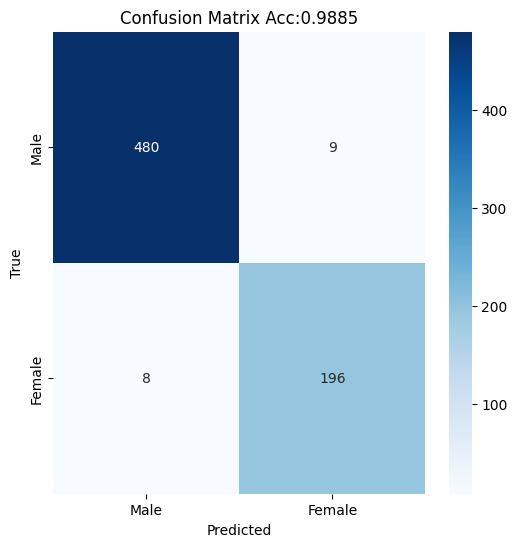

In [ ]:
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

print(classification_report(y_true, y_pred_classes, target_names=["Male", "Female"]))

# Plot Confusion Matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Male", "Female"], yticklabels=["Male", "Female"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title(f"Confusion Matrix Acc:{test_acc:.4f}")
plt.show()

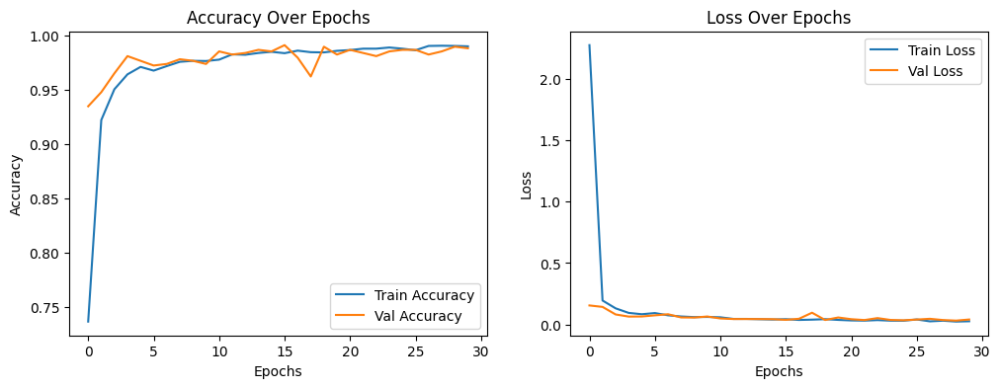

In [ ]:
plt.figure(figsize=(12, 4))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy Over Epochs")

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Over Epochs")

plt.show()

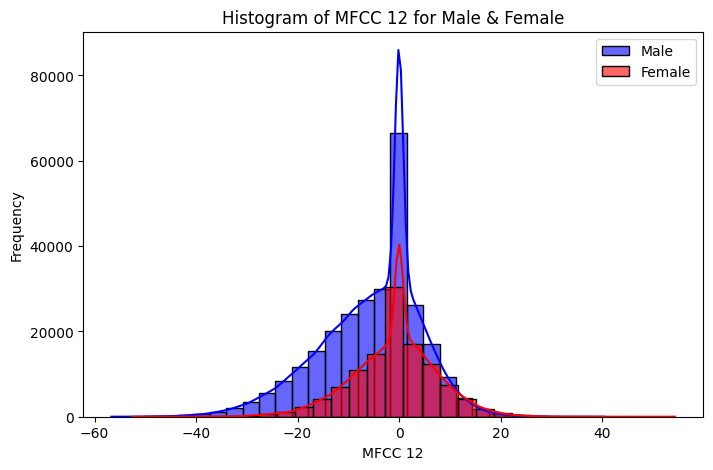

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Extract a single MFCC feature (e.g., first MFCC coefficient)
mfcc_index = 12

# Flatten the arrays
male_mfcc = X_train[y_train[:, 0] == 1][:, mfcc_index, :].flatten()
female_mfcc = X_train[y_train[:, 1] == 1][:, mfcc_index, :].flatten()

# Plot histogram
plt.figure(figsize=(8, 5))
sns.histplot(male_mfcc, bins=30, color='blue', alpha=0.6, label='Male', kde=True)
sns.histplot(female_mfcc, bins=30, color='red', alpha=0.6, label='Female', kde=True)

plt.xlabel(f'MFCC {mfcc_index}')
plt.ylabel('Frequency')
plt.title(f'Histogram of MFCC {mfcc_index} for Male & Female')
plt.legend()
plt.show()

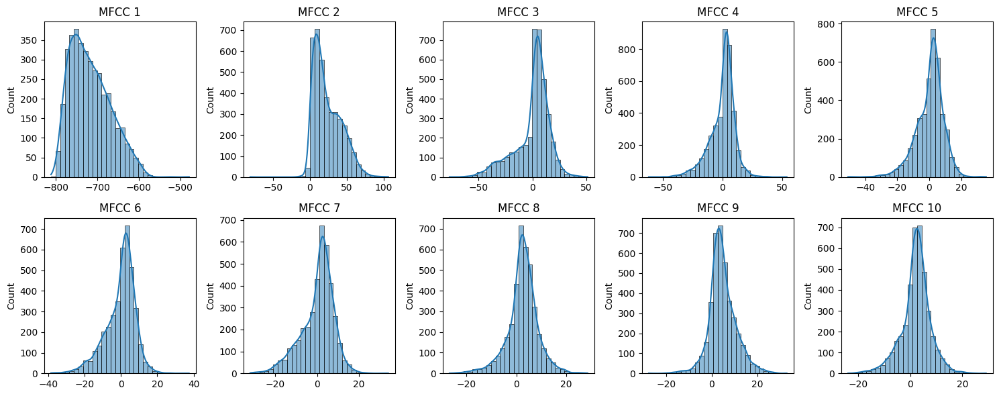

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

num_mfccs = 10  # Number of MFCCs to visualize
fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # Adjust layout

for i, ax in enumerate(axes.flatten()):
    if i < num_mfccs:
        sns.histplot(X_train[:, i, 0].flatten(), bins=30, ax=ax, kde=True)  # Flattened
        ax.set_title(f'MFCC {i+1}')

plt.tight_layout()
plt.show()

<ipython-input-18-ab40351c3a50>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['Male', 'Female'], y=gender_counts, palette=['blue', 'red'])


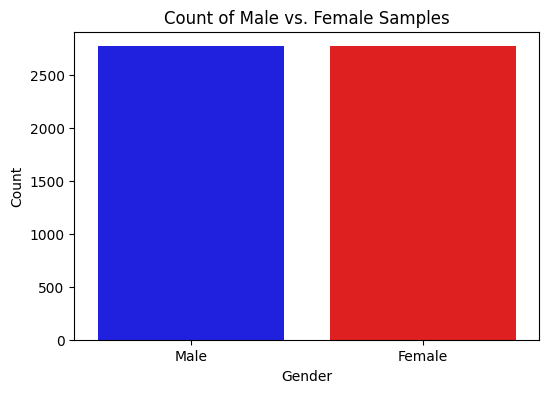

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Convert one-hot encoded labels to class labels
y_train_labels = np.argmax(y_train_resampled, axis=1)

# Count occurrences of each gender
gender_counts = np.bincount(y_train_labels)

# Create bar plot
plt.figure(figsize=(6, 4))
sns.barplot(x=['Male', 'Female'], y=gender_counts, palette=['blue', 'red'])
plt.xlabel("Gender")
plt.ylabel("Count")
plt.title("Count of Male vs. Female Samples")
plt.show()


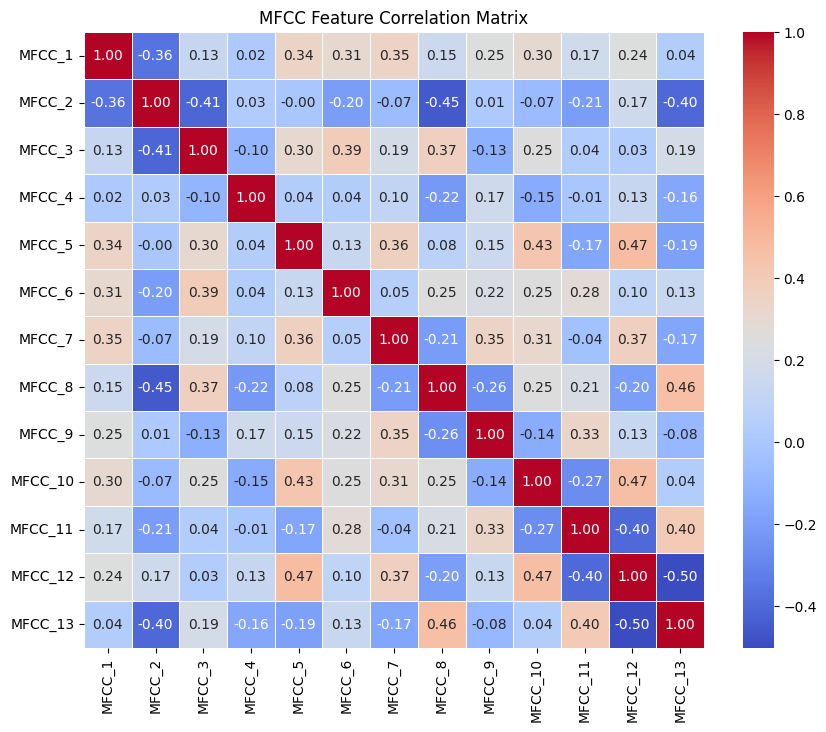

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Compute mean of MFCC features over time frames (axis=2) to get a 2D shape
mfcc_mean = X_train_resampled.mean(axis=2).squeeze()  # Shape: (5542, 13)

# Convert to DataFrame
df = pd.DataFrame(mfcc_mean, columns=[f'MFCC_{i+1}' for i in range(mfcc_mean.shape[1])])

# Compute correlation matrix
corr_matrix = df.corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("MFCC Feature Correlation Matrix")
plt.show()

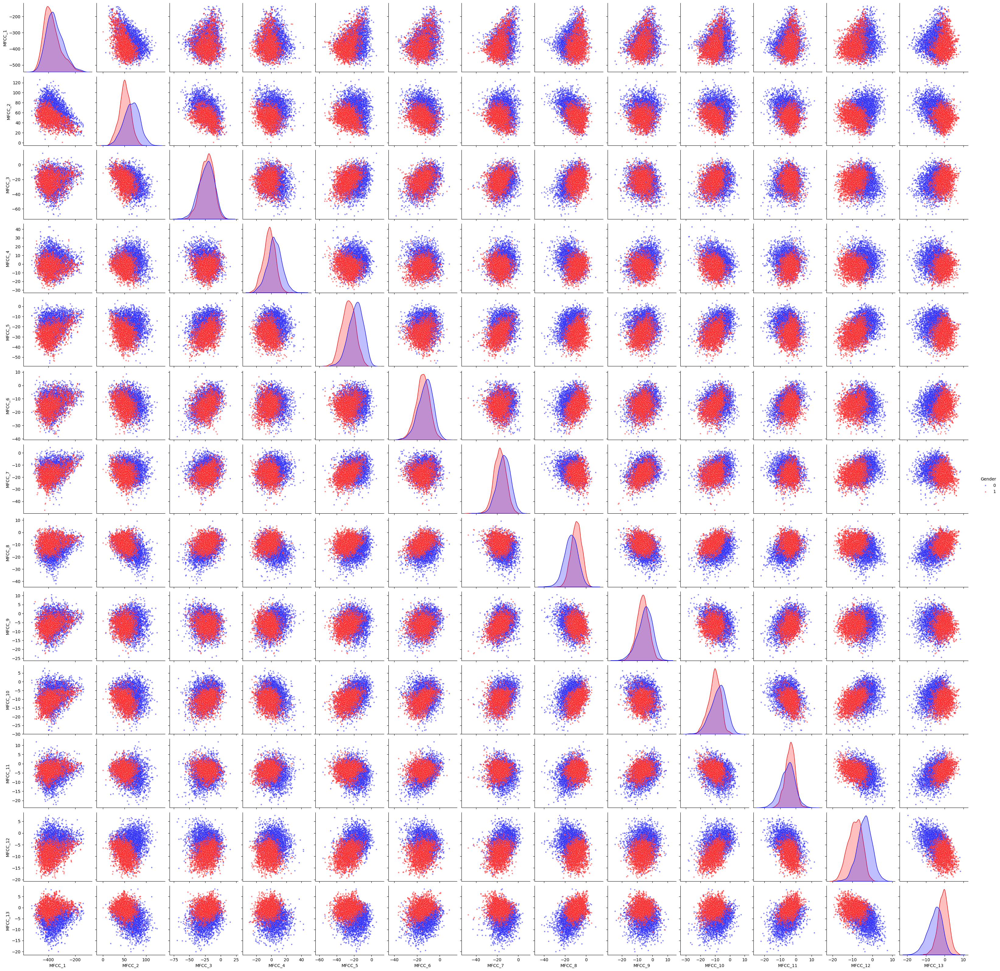

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Reduce shape (5542, 13, 100) -> (5542, 13) by averaging over time frames
mfcc_mean = X_train_resampled.mean(axis=2).squeeze()  # Shape: (5542, 13)

# Convert to DataFrame
df = pd.DataFrame(mfcc_mean, columns=[f'MFCC_{i+1}' for i in range(mfcc_mean.shape[1])])

# Add gender labels
df['Gender'] = y_train_resampled.argmax(axis=1)  # Convert one-hot to class labels

# Pair plot
sns.pairplot(df, hue='Gender', palette=['blue', 'red'], diag_kind='kde', plot_kws={'alpha': 0.5, 's': 10})
plt.show()

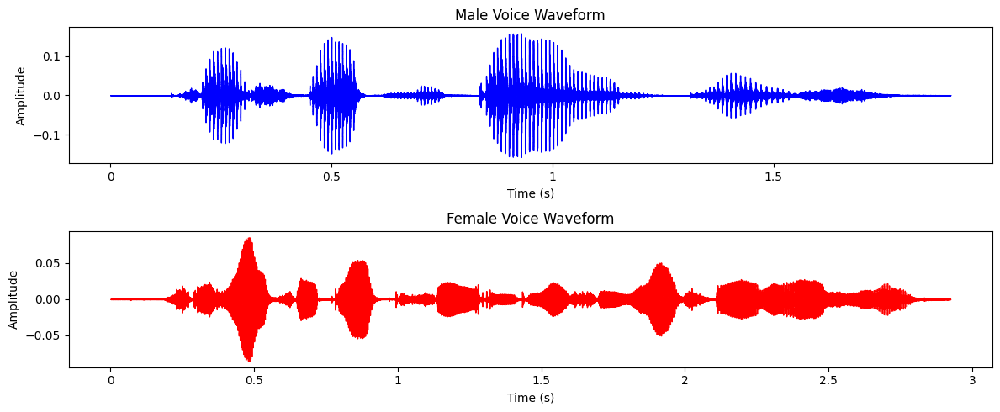

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load a sample male and female audio file
male_audio_path = "/root/.cache/kagglehub/datasets/mfekadu/darpa-timit-acousticphonetic-continuous-speech/versions/6/data/TRAIN/DR1/MKLW0/SI2201.WAV"
female_audio_path = '/root/.cache/kagglehub/datasets/mfekadu/darpa-timit-acousticphonetic-continuous-speech/versions/6/data/TRAIN/DR1/FCJF0/SA1.WAV'

# Load waveforms
male_waveform, sr_male = librosa.load(male_audio_path, sr=None)
female_waveform, sr_female = librosa.load(female_audio_path, sr=None)

# Plot waveforms
plt.figure(figsize=(12, 5))

# Male waveform
plt.subplot(2, 1, 1)
librosa.display.waveshow(male_waveform, sr=sr_male, color='blue')
plt.title("Male Voice Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

# Female waveform
plt.subplot(2, 1, 2)
librosa.display.waveshow(female_waveform, sr=sr_female, color='red')
plt.title("Female Voice Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

plt.tight_layout()
plt.show()

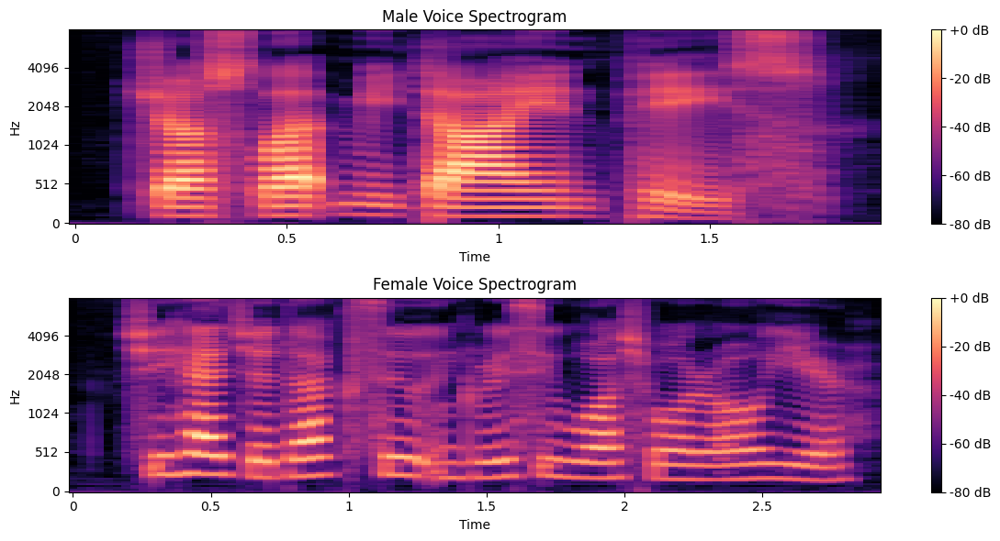

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Paths to male and female audio files (update with actual paths)
male_audio_path = "/root/.cache/kagglehub/datasets/mfekadu/darpa-timit-acousticphonetic-continuous-speech/versions/6/data/TRAIN/DR1/MKLW0/SI2201.WAV"
female_audio_path = '/root/.cache/kagglehub/datasets/mfekadu/darpa-timit-acousticphonetic-continuous-speech/versions/6/data/TRAIN/DR1/FCJF0/SA1.WAV'

# Load waveforms
male_waveform, sr_male = librosa.load(male_audio_path, sr=None)
female_waveform, sr_female = librosa.load(female_audio_path, sr=None)

# Compute spectrograms
male_spectrogram = librosa.feature.melspectrogram(y=male_waveform, sr=sr_male, n_mels=128, fmax=8000)
female_spectrogram = librosa.feature.melspectrogram(y=female_waveform, sr=sr_female, n_mels=128, fmax=8000)

# Convert to log scale
male_db = librosa.power_to_db(male_spectrogram, ref=np.max)
female_db = librosa.power_to_db(female_spectrogram, ref=np.max)

# Plot spectrograms
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
librosa.display.specshow(male_db, sr=sr_male, x_axis='time', y_axis='mel')
plt.colorbar(format="%+2.0f dB")
plt.title("Male Voice Spectrogram")

plt.subplot(2, 1, 2)
librosa.display.specshow(female_db, sr=sr_female, x_axis='time', y_axis='mel')
plt.colorbar(format="%+2.0f dB")
plt.title("Female Voice Spectrogram")

plt.tight_layout()
plt.show()


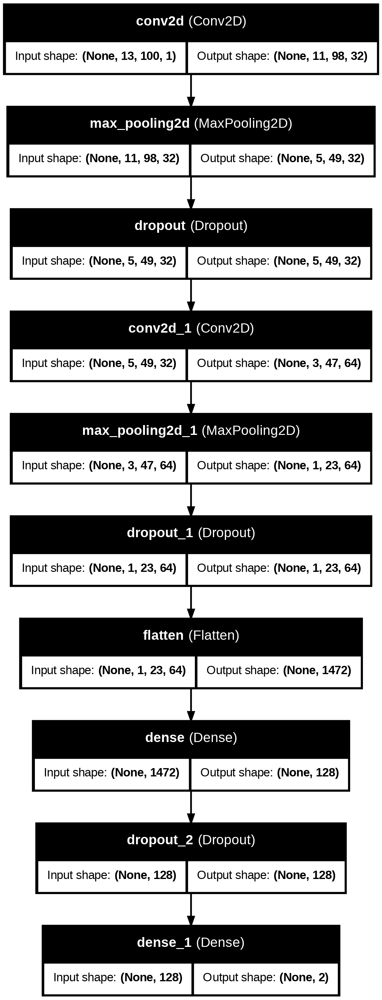

In [ ]:
from tensorflow.keras.utils import plot_model

# Assuming your model is stored in a variable named `model`
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


In [ ]:
from tensorflow.keras.callbacks import TensorBoard
import os

# Set up the directory for TensorBoard logs
log_dir = os.path.join("logs", "fit")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Train the model with TensorBoard callback
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), callbacks=[tensorboard_callback])


Epoch 1/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - accuracy: 0.9854 - loss: 0.0400 - val_accuracy: 0.9885 - val_loss: 0.0338
Epoch 2/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - accuracy: 0.9922 - loss: 0.0287 - val_accuracy: 0.9885 - val_loss: 0.0436
Epoch 3/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step - accuracy: 0.9902 - loss: 0.0318 - val_accuracy: 0.9812 - val_loss: 0.0547
Epoch 4/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.9888 - loss: 0.0310 - val_accuracy: 0.9856 - val_loss: 0.0379
Epoch 5/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.9883 - loss: 0.0333 - val_accuracy: 0.9870 - val_loss: 0.0345
Epoch 6/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - accuracy: 0.9928 - loss: 0.0165 - val_accuracy: 0.9856 - val_loss: 0.0311
Epoch 7/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step - accuracy: 0.9906 - loss: 0.0272 - val_accuracy: 0.9856 - val_loss: 0.0302
Epoch 8/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.9934 - loss: 0.0169 - val

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


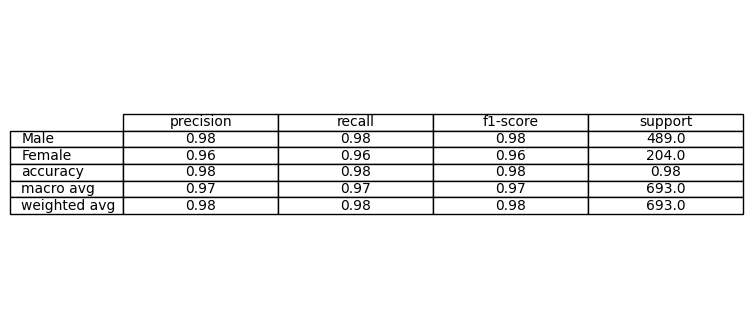

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report

# Generate classification report
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

report_dict = classification_report(y_true, y_pred_classes, target_names=["Male", "Female"], output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()

# Plot as a table
fig, ax = plt.subplots(figsize=(8, 4))
ax.axis('tight')
ax.axis('off')
ax.table(cellText=report_df.round(2).values, colLabels=report_df.columns,
         rowLabels=report_df.index, cellLoc='center', loc='center')

# Show the figure
plt.show()


In [ ]:
history = model.fit(X_train_resampled, y_train_resampled, epochs=30, batch_size=32,
                    validation_data=(X_test, y_test))
# Extract accuracy and loss values
epochs = range(1, len(history.history['accuracy']) + 1)
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']
# Plot accuracy
axes[0].plot(epochs, train_acc, 'b-', label="Training Accuracy")
axes[0].plot(epochs, val_acc, 'r-', label="Validation Accuracy")
axes[0].set_title("Model Accuracy per Epoch")
axes[0].set_xlabel("Epochs")
axes[0].set_ylabel("Accuracy")
axes[0].legend()

# Plot loss
axes[1].plot(epochs, train_loss, 'b-', label="Training Loss")
axes[1].plot(epochs, val_loss, 'r-', label="Validation Loss")
axes[1].set_title("Model Loss per Epoch")
axes[1].set_xlabel("Epochs")
axes[1].set_ylabel("Loss")
axes[1].legend()

# Show the figure
plt.show()

AttributeError: 'numpy.ndarray' object has no attribute 'plot'